In [130]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay)
import seaborn as sns
from tqdm import tqdm
from rembg import remove

## Data Loading

Buat struktur folder dataset sebagai berikut:
```
.
└──dataset
    ├── label1
	├── image1.jpg
	├── image2.jpg
	└── image3.jpg
    ├── label2
    └── label3
    └── dst...
```

In [131]:
data = []
labels = []
file_name = []
for sub_folder in os.listdir("dataset\\"):
    sub_folder_files = os.listdir(os.path.join("dataset\\", sub_folder))
    for i, filename in enumerate(sub_folder_files):
        img_path = os.path.join("dataset\\", sub_folder, filename)
        img = cv.imread(img_path)
        img = img.astype(np.uint8)
        
        data.append(img)
        labels.append(sub_folder)
        name = os.path.splitext(filename)[0]
        file_name.append(filename)
        
data = np.array(data)
labels = np.array(labels)


## Data Augmentation

### Define Augmentation Function


In [132]:
# melakukan augmentasi data
data_augmented = []
labels_augmented = []
paths_augmented = []
file_name_augmented = []
for i in range(len(data)):
	pass

In [133]:
print("Data sebelum augmentasi: ", len(data))
print("Data setelah augmentasi: ", len(data_augmented))

Data sebelum augmentasi:  300
Data setelah augmentasi:  0


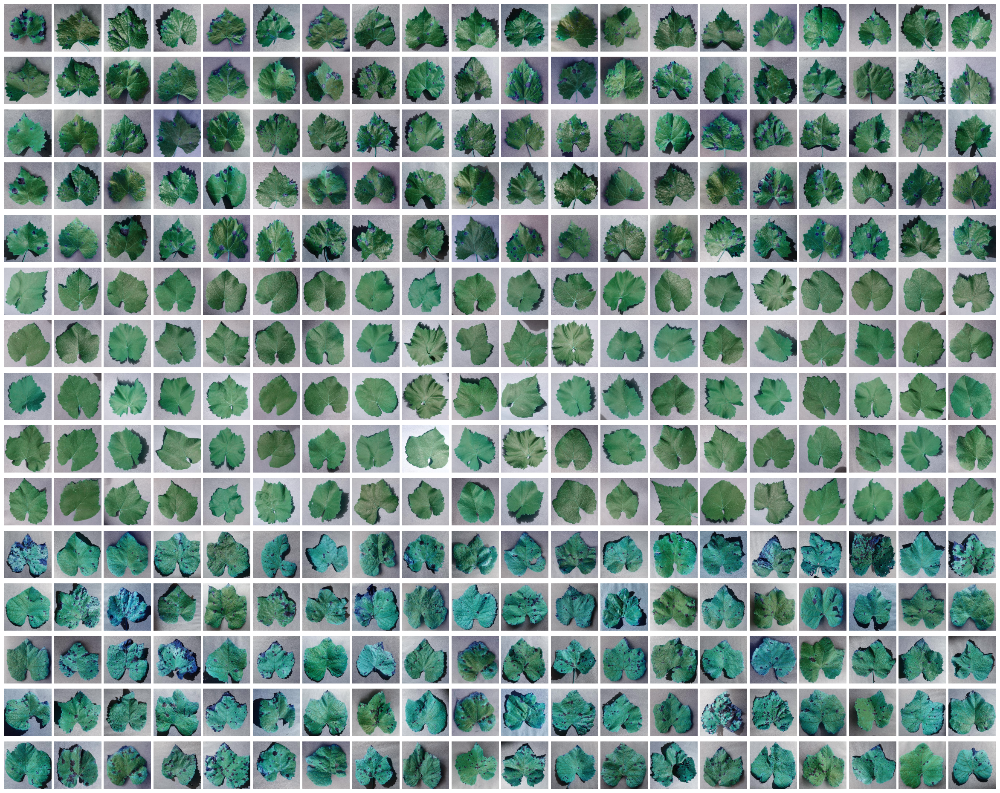

In [134]:
max_display = 400
display_data = data[:max_display]

columns = 20
total = len(display_data)
rows = -(-total // columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(30, 24))

axes_list = axes.ravel() if total > 1 else [axes]

for idx in range(rows * columns):
    ax = axes_list[idx]
    if idx < total:
        ax.imshow(display_data[idx])
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

In [135]:
# Siapkan dictionary kosong
data_kategori = {}

# Bangun struktur kategori -> list of (filename, image)
for img, label, fname in zip(data, labels, file_name):
    if label not in data_kategori:
        data_kategori[label] = []
    data_kategori[label].append((fname, img))  # (filename, image)



In [136]:
def removeBackgroundByCategory(data):
    removed_data = {}
    for kategori, items in data.items():
        removed_list = []
        for filename, img in tqdm(items, desc=f"remove background {kategori}"):
            img_removed = remove(img)
            removed_list.append((filename, img_removed))
        removed_data[kategori] = removed_list
    return removed_data

# 4. Fungsi grayscaling
def gray_scaling(data):
    gray_data = {}
    for kategori, items in data.items():
        gray_list = []
        for filename, img in tqdm(items, desc=f"grayscaling {kategori}"):
            gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
            gray_list.append((filename, gray))  
        gray_data[kategori] = gray_list
    return gray_data

# 5. Jalankan proses
removej = removeBackgroundByCategory(data_kategori)
grayj = gray_scaling(removej)


grayscaling Leaf_blight: 100%|██████████| 100/100 [00:00<00:00, 12484.91it/s]


Kategori: Black_rot


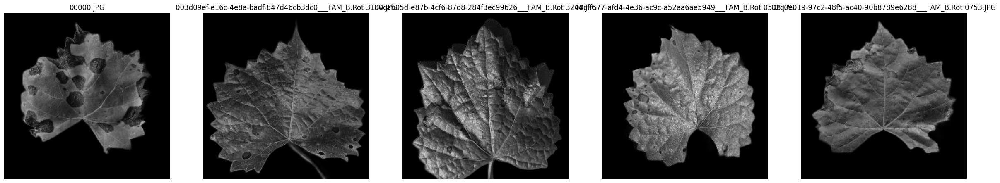

Kategori: Healthy


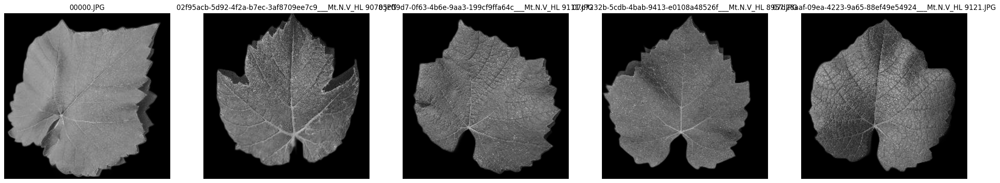

Kategori: Leaf_blight


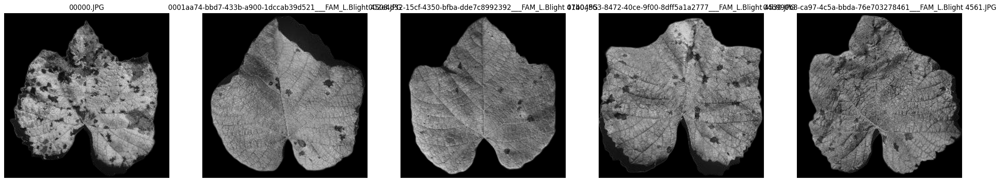

In [137]:
n_display = 5

for kategori, items in grayj.items():
    print(f"Kategori: {kategori}")
    plt.figure(figsize=(30, 15))
    
    for i, (filename, img) in enumerate(items[:n_display]):
        plt.subplot(1, n_display, i+1)
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGRA2RGBA))
        plt.title(filename)
        plt.axis('off')
    
    plt.show()

## Data Preparation

### Define Preprocessing Function


In [138]:
def resize(img, th, tw):
    h, w = img.shape
    resized = np.zeros((th, tw), dtype=np.uint8)
    
    skala_y = h / th
    skala_x = w / tw
    
    for i in range(th):
        for j in range(tw):
            src_y = int(i * skala_y)
            src_x = int(j * skala_x)
            resized[i, j] = img[src_y, src_x]
    
    return resized

def normalisasi(img):
    min_val = np.min(img)
    max_val = np.max(img)
    if max_val - min_val == 0:
        return np.zeros_like(img, dtype=np.uint8)
    normalized_img = ((img - min_val) / (max_val - min_val)) * 255
    return normalized_img.astype(np.uint8)

def ekualisasi(img):
    hist = np.zeros(256, dtype=int)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            hist[img[i, j]] += 1

    total_pixels = img.shape[0] * img.shape[1]
    pdf = hist / total_pixels

    cdf = np.zeros(256)
    cdf[0] = pdf[0]
    for i in range(1, 256):
        cdf[i] = cdf[i - 1] + pdf[i]

    cdf_normalized = np.round(cdf * 255).astype(np.uint8)

    ekualisasi_img = np.zeros_like(img)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            ekualisasi_img[i, j] = cdf_normalized[img[i, j]]

    return ekualisasi_img

def histogram(frag):
    hist = np.zeros(256)
    img_flat = frag.flatten()

    for i in img_flat:
        hist[i] += 1
        
    hist_y = hist
    hist_x = np.arange(0, len(hist))
    return hist_y, hist_x

def spesifikasi(img, img_ref):
    hist_input = histogram(img)
    hist_ref = histogram(img_ref)

    cdf_input = np.cumsum(hist_input) / np.sum(hist_input)
    cdf_ref = np.cumsum(hist_ref) / np.sum(hist_ref)

    map_hist = np.zeros(256, dtype=np.uint8)
    for i in range(256):
        selisih = np.abs(cdf_input[i] - cdf_ref)
        map_hist[i] = np.argmin(selisih)

    hasil = map_hist[img]
    return hasil

def konvo(img, kernel):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h // 2
    pad_w = kernel_w // 2
    pad_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='edge')
    result = np.zeros([img_h, img_w])

    for i in range(img_h):
        for j in range(img_w):
            result[i, j] = np.sum(pad_img[i:i+kernel_h, j:j+kernel_w] * kernel)

    result = (result - result.min()) / (result.max() - result.min()) * 255
    return result.astype(np.uint8)


def op_modus (piksel_values):
    count = {}
    for num in piksel_values:
        if num in count:
            count[num] +=1
        else:
            count[num] = 1

    max_count = 0
    modus = None
    for num in count:
        if count[num] > max_count:
            max_count = count[num]
            modus = num
    return modus

def op_median(piksel_values):
    n = len(piksel_values)
    sorted_piksel = sorted(piksel_values)
    if n % 2 == 0:
        median1 = sorted_piksel[n//2]
        median2 = sorted_piksel[n//2-1]
        median = (median1 + median2)/2
    else:
        median = sorted_piksel[n//2]
    return median

def konvo_modmed(img, kernel, jenis):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h //2
    pad_w = kernel_w //2
    pad_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='edge')
    result = np.zeros_like(img)

    for i in range(img_h):
        for j in range (img_w):
            temp = np.zeros(len(kernel)*len(kernel))
            indeks = 0
            for k in range (kernel_h):
                for l in range (kernel_w):
                    temp[indeks] += pad_img[i+k, j+l]
                    indeks+=1
                    if(jenis=="modus"):
                        result[i, j] = op_modus(temp)
                    else:
                        result[i, j] = op_median(temp)
    return result

Rt = np.array([[1,0],
               [0,-1]])

Rk = np.array([[0,1],
               [-1,0]])

Sx = np.array([[-1,0,1],
               [-2,0,2],
               [-1,0,1]])

Sy = np.array([[1,2,1],
               [0,0,0],
               [-1,-2,-1]])

Px = np.array([[-1,0,1],
               [-1,0,1],
               [-1,0,1]])

Py = np.array([[1,1,1],
               [0,0,0],
               [-1,-1,-1]])

kernel_3x3 = np.full((3,3), 1/9)
kernel3x3_empty = np.full((3,3), 0)

def padding_baris(img):
    h, w = img.shape
    img_pad = np.zeros((h, w+1))
    for i in range(h):
        for j in range(w):
            img_pad[i][j] = img[i][j]
    return img_pad

def padding_kolom(img):
    h, w = img.shape
    img_pad = np.zeros((h+1, w))
    for i in range(h):
        for j in range(w):
            img_pad[i][j] = img[i][j]
    return img_pad

def konvo_edge(img, kernel, jenis):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h //2
    pad_w = kernel_w //2
    if(jenis!="roberts"):
        padded_img =  np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    else:
        padded_baris = padding_baris(img)
        padded_img = padding_kolom(padded_baris)
    result = np.zeros([img_h, img_w])

    for i in range(img_h):
        for j in range(img_w):
            result[i, j] = np.sum(padded_img[i:i+kernel_h, j:j+kernel_w] * kernel)
    return result

def edge(image, kernelX, kernelY, jenis):
    gradX = konvo_edge(image, kernelX, jenis)
    gradY = konvo_edge(image, kernelY, jenis)

    M = np.sqrt((gradX*gradX)+(gradY*gradY))

    return M.astype(np.uint8)

def threshold(img, batas):
    hasil = np.copy(img)
    hasil[hasil>=batas] = 0
    hasil[hasil<batas] = 255
    return hasil

def erosi(img, kernel):
    h, w = img.shape
    kernel_h, kernel_w = kernel.shape
    center = kernel_h//2
    hasil = np.zeros((h,w))

    for i in range(center, h-center):
        for j in range(center, w-center):
            cocok = True
            for x in range(kernel_h):
                for y in range(kernel_w):
                    if kernel[x, y] == 1 and img[i + x - center, j + y - center] == 0:
                        cocok = False
                        break
                if not cocok:
                    break
            if cocok:
                hasil[i,j] = 255
    return hasil

def dilasi(img, kernel):
    h, w = img.shape
    kernel_h, kernel_w = kernel.shape
    center = kernel_h//2
    hasil = np.zeros((h,w))

    for i in range(center, h-center):
        for j in range(center, w-center):
            if img[i,j] == 255:
                for x in range(kernel_h):
                    for y in range(kernel_w):
                        if kernel[x,y] == 1:
                            hasil[i+x-center, j+y-center] = 255
            else:
                if hasil[i,j] != 255:
                    hasil[i,j] = 0
    return hasil

def opening(img, kernel):
    erosi_result = erosi(img, kernel)
    hasil = dilasi(erosi_result, kernel)
    return hasil

def closing(img, kernel):
    dilasi_result = dilasi(img, kernel)
    hasil = erosi(dilasi_result, kernel)
    return hasil

def gradien_morph(img, kernel):
    dilated = dilasi(img, kernel)
    eroded = erosi(img, kernel)
    gradient = dilated - eroded
    return gradient

kernel_smooth = np.array([[1/10, 1/10, 1/10],
                         [1/10, 1/5, 1/10],
                         [1/10, 1/10, 1/10]])
kernel_sharp = np.array([[1/9, 1/9, 1/9],
                         [1/9, 8/9, 1/9],
                         [1/9, 1/9, 1/9]])
                    

### Preprocessing

In [139]:
data = []

for items in grayj.values():
    for _, img in items:
        data.append(img)


In [ ]:
dataPreprocessed = []
for i in range(len(data)): # Loop through each image and do preprocessing
	img = data[i]
	img = resize(img, 128, 128)
	img = normalisasi(img)
	img = konvo_modmed(img, kernel3x3_empty, "median")  # kernel 3x3
	img = edge(img, Sx, Sy, "sobel")


	dataPreprocessed.append(img)

	

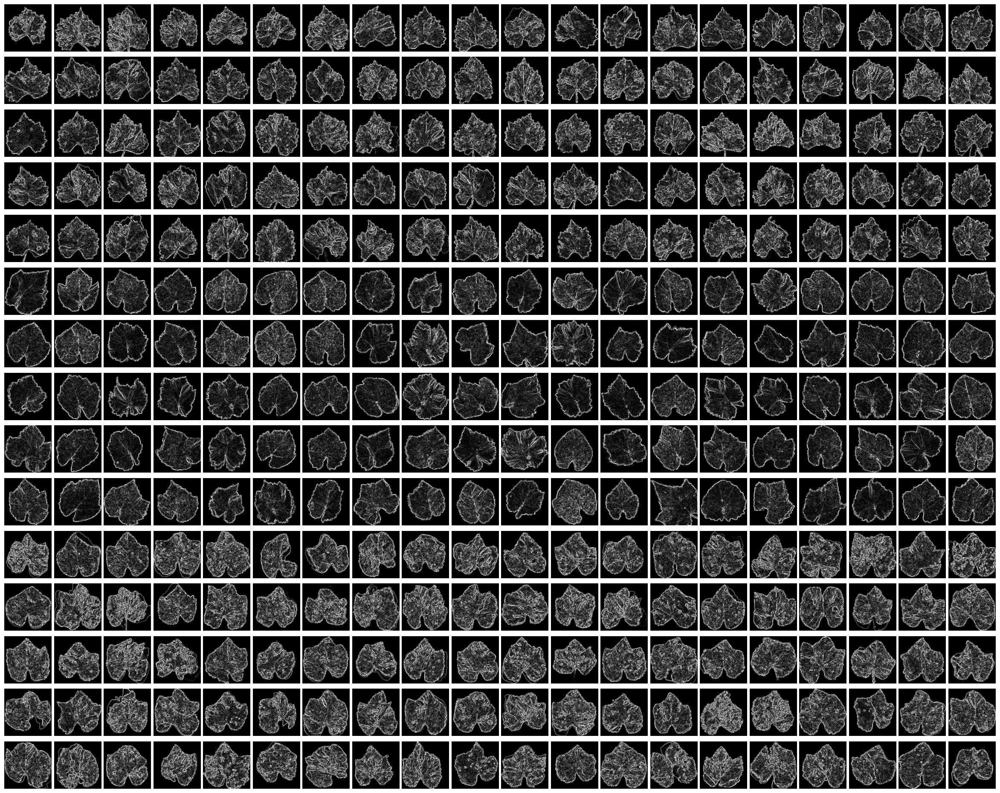

In [402]:
max_display = 400
display_data = dataPreprocessed[:max_display]

columns = 20
total = len(display_data)
rows = -(-total // columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(30, 24))

axes_list = axes.ravel() if total > 1 else [axes]

for idx in range(rows * columns):
    ax = axes_list[idx]
    if idx < total:
        ax.imshow(display_data[idx], cmap='gray')
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

### Feature Extraction

In [403]:
def glcm(image, derajat):
    if derajat == 0:
        angles = [0]
    elif derajat == 45:
        angles = [np.pi / 4]
    elif derajat == 90:
        angles = [np.pi / 2]
    elif derajat == 135:
        angles = [3 * np.pi / 4]
    else:
        raise ValueError("Invalid angle. It should be one of the following: 0, 45, 90, 135.")
    
    # mengembalikan matrix glcm dari image
    glcm = graycomatrix(image, [1], angles, 256, symmetric=True, normed=True)
    return glcm

In [404]:
def correlation(matriks):
	return graycoprops(matriks, 'correlation')[0, 0]

In [405]:
def dissimilarity(matriks):
    return graycoprops(matriks, 'dissimilarity')[0, 0]

In [406]:
def homogenity(matriks):
    return graycoprops(matriks, 'homogeneity')[0, 0]

In [407]:
def contrast(matriks):
    return graycoprops(matriks, 'contrast')[0, 0]

In [408]:
def ASM(matriks):
    return graycoprops(matriks, 'ASM')[0, 0]

In [409]:
def energy(matriks):
    return graycoprops(matriks, 'energy')[0, 0]

In [410]:
def entropyGlcm(matriks):
    return entropy(matriks.ravel())

In [411]:
Derajat0 = []
Derajat45 = []
Derajat90 = []
Derajat135 = []
for i in range(len(dataPreprocessed)):
    D0 = glcm(dataPreprocessed[i], 0)
    D45 = glcm(dataPreprocessed[i], 45)
    D90 = glcm(dataPreprocessed[i], 90)
    D135 = glcm(dataPreprocessed[i], 135)
    Derajat0.append(D0)
    Derajat45.append(D45)
    Derajat90.append(D90)
    Derajat135.append(D135)

In [412]:
Kontras0, Kontras45, Kontras90, Kontras135 = [], [], [], []
dissimilarity0, dissimilarity45, dissimilarity90, dissimilarity135 =  [], [], [], []
homogenity0, homogenity45, homogenity90, homogenity135 = [], [], [], []
entropy0, entropy45, entropy90, entropy135 =  [], [], [], []
ASM0, ASM45, ASM90, ASM135 =  [], [], [], []
energy0, energy45, energy90, energy135 =  [], [], [], []
correlation0, correlation45, correlation90, correlation135 = [], [], [], []


In [413]:
for i in range(len(dataPreprocessed)):
    C0 = correlation(Derajat0[i])
    correlation0.append(C0)
    C45 = correlation(Derajat45[i])
    correlation45.append(C45)
    C90 = correlation(Derajat90[i])
    correlation90.append(C90)
    C135 = correlation(Derajat135[i])
    correlation135.append(C135)

In [414]:
for i in range(len(dataPreprocessed)):
    K0 = contrast(Derajat0[i])
    K45 = contrast(Derajat45[i])
    K90 = contrast(Derajat90[i])
    K135 = contrast(Derajat135[i])
    Kontras0.append(K0)
    Kontras45.append(K45)
    Kontras90.append(K90)
    Kontras135.append(K135)

In [415]:
for i in range(len(dataPreprocessed)):
    Dis0 = dissimilarity(Derajat0[i])
    Dis45 = dissimilarity(Derajat45[i])
    Dis90 = dissimilarity(Derajat90[i])
    Dis135 = dissimilarity(Derajat135[i])
    dissimilarity0.append(Dis0)
    dissimilarity45.append(Dis45)
    dissimilarity90.append(Dis90)
    dissimilarity135.append(Dis135)

In [416]:
for i in range(len(dataPreprocessed)):
    H0 = homogenity(Derajat0[i])
    H45 = homogenity(Derajat45[i])
    H90 = homogenity(Derajat90[i])
    H135 = homogenity(Derajat135[i])
    homogenity0.append(H0)
    homogenity45.append(H45)
    homogenity90.append(H90)
    homogenity135.append(H135)

In [417]:
for i in range(len(dataPreprocessed)):  
    E0 = entropyGlcm(Derajat0[i])
    E45 = entropyGlcm(Derajat45[i])
    E90 = entropyGlcm(Derajat90[i])
    E135 = entropyGlcm(Derajat135[i])
    entropy0.append(E0)
    entropy45.append(E45)
    entropy90.append(E90)
    entropy135.append(E135)

In [418]:
for i in range(len(dataPreprocessed)):
    A0 = ASM(Derajat0[i])
    A45 = ASM(Derajat45[i])
    A90 = ASM(Derajat90[i])
    A135 = ASM(Derajat135[i])
    ASM0.append(A0)
    ASM45.append(A45)
    ASM90.append(A90)
    ASM135.append(A135)

In [419]:
for i in range(len(dataPreprocessed)):
    ER0 = energy(Derajat0[i])
    ER45 = energy(Derajat45[i])
    ER90 = energy(Derajat90[i])
    ER135 = energy(Derajat135[i])
    energy0.append(ER0)
    energy45.append(ER45)
    energy90.append(ER90)
    energy135.append(ER135)

In [420]:
print("Filename:", len(file_name))
print("Label:", len(labels))
print("Kontras0:", len(Kontras0))
print("Kontras45:", len(Kontras45))
print("Kontras90:", len(Kontras90))
print("Kontras135:", len(Kontras135))
print("Homogeneity0:", len(homogenity0))
print("Homogeneity45:", len(homogenity45))
print("Homogeneity90:", len(homogenity90))
print("Homogeneity135:", len(homogenity135))
print("Entropy0:", len(entropy0))
print("Entropy45:", len(entropy45))
print("Entropy90:", len(entropy90))
print("Entropy135:", len(entropy135))
print("Correlation0:", len(correlation0))
print("Correlation45:", len(correlation45))
print("Correlation90:", len(correlation90))
print("Correlation135:", len(correlation135))


Filename: 300
Label: 300
Kontras0: 300
Kontras45: 300
Kontras90: 300
Kontras135: 300
Homogeneity0: 300
Homogeneity45: 300
Homogeneity90: 300
Homogeneity135: 300
Entropy0: 300
Entropy45: 300
Entropy90: 300
Entropy135: 300
Correlation0: 300
Correlation45: 300
Correlation90: 300
Correlation135: 300


### Write the extraction's results to CSV 

In [421]:
dataTable = {'Filename': file_name, 'Label': labels,
        'Contrast0': Kontras0, 'Contrast45': Kontras45, 'Contrast90': Kontras90, 'Contrast135': Kontras135,
        'Homogeneity0': homogenity0, 'Homogeneity45': homogenity45, 'Homogeneity90': homogenity90, 'Homogeneity135': homogenity135,
        'Dissimilarity0': dissimilarity0, 'Dissimilarity45': dissimilarity45, 'Dissimilarity90': dissimilarity90, 'Dissimilarity135': dissimilarity135,
        'Entropy0': entropy0, 'Entropy45': entropy45, 'Entropy90': entropy90, 'Entropy135': entropy135,
        'ASM0': ASM0, 'ASM45': ASM45, 'ASM90': ASM90, 'ASM135': ASM135,
        'Energy0': energy0, 'Energy45': energy45, 'Energy90': energy90, 'Energy135': energy135,
        'Correlation0': correlation0, 'Correlation45': correlation45, 'Correlation90': correlation90, 'Correlation135': correlation135,
        }
df = pd.DataFrame(dataTable)
df.to_csv('hasil_ekstraksi_1.csv', index=False)

hasilEkstrak = pd.read_csv('hasil_ekstraksi_1.csv')
hasilEkstrak


,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,00000.JPG,Black_rot,1928.786786,2335.116994,1916.343012,2243.659619,0.558142,0.549002,0.560942,0.549885,...,0.290365,0.282034,0.537564,0.531255,0.538855,0.531069,0.713817,0.655139,0.715664,0.668646
1,003d09ef-e16c-4e8a-badf-847d46cb3dc0___FAM_B.R...,Black_rot,2297.686762,2918.088350,2635.655573,3237.266105,0.411493,0.401761,0.410346,0.396017,...,0.149922,0.142206,0.385727,0.378652,0.387197,0.377102,0.701585,0.621847,0.657560,0.580485
2,00cab05d-e87b-4cf6-87d8-284f3ec99626___FAM_B.R...,Black_rot,2674.515256,2952.717031,2482.038078,3465.337777,0.353992,0.347085,0.359669,0.343090,...,0.109753,0.103358,0.328528,0.321750,0.331289,0.321494,0.670334,0.635952,0.693492,0.572750
3,00cff577-afd4-4e36-ac9c-a52aa6ae5949___FAM_B.R...,Black_rot,1767.940576,2205.879348,1652.379060,2273.223262,0.495455,0.487040,0.498320,0.483521,...,0.224179,0.215238,0.472062,0.465549,0.473476,0.463937,0.716718,0.647907,0.735235,0.637158
4,02c0e019-97c2-48f5-ac40-90b8789e6288___FAM_B.R...,Black_rot,1696.614788,2381.733151,2115.453002,2340.049724,0.528307,0.517868,0.526007,0.518385,...,0.255678,0.248220,0.505095,0.498527,0.505646,0.498217,0.740911,0.637823,0.676951,0.644162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,4cd25f42-7cda-4507-a1bd-a03b5f439ef5___FAM_L.B...,Leaf_blight,2643.535064,3071.940542,2332.185101,3224.763780,0.306576,0.297246,0.313102,0.298925,...,0.080246,0.074752,0.278605,0.271866,0.283278,0.273408,0.633450,0.574514,0.676617,0.553346
296,4d7ad495-1420-4ac7-9123-f0aa1e828270___FAM_L.B...,Leaf_blight,2511.817667,2809.132742,2225.190084,3059.763780,0.390137,0.381162,0.390544,0.378461,...,0.134256,0.127769,0.365422,0.357756,0.366410,0.357447,0.644685,0.603624,0.685230,0.568259
297,4d8aa281-ddb5-4f46-a95c-72a65c59903a___FAM_L.B...,Leaf_blight,1874.298228,2205.383347,1774.810285,2345.091574,0.434552,0.423263,0.433946,0.421467,...,0.165154,0.159733,0.407438,0.399544,0.406392,0.399667,0.673772,0.617454,0.691445,0.593220
298,4e32244f-8e20-4788-8c49-93e971113104___FAM_L.B...,Leaf_blight,1793.787094,2359.110360,1842.850886,2107.331205,0.307425,0.291400,0.306129,0.296093,...,0.073688,0.069550,0.271643,0.263598,0.271456,0.263724,0.643785,0.531624,0.633842,0.581612


### Features Selection

pada bagian seleksi fitur ini bisa menggunakan metode seperti
- PCA
- LDA
- t-SNE
- Chi-square
- ANOVA
- Autoencoder
- correlation
- dll

berikut contoh menggunakan correlation:

<Axes: >

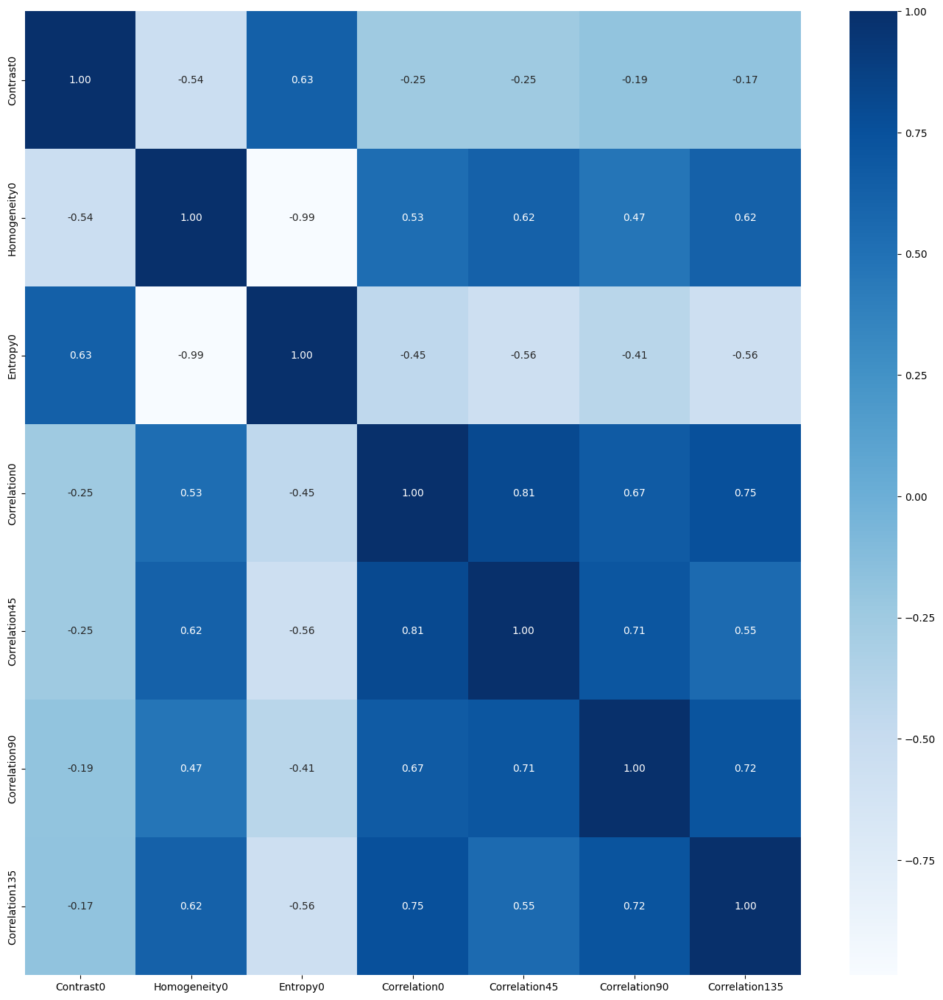

In [422]:
# Menghitung korelasi
correlation = hasilEkstrak.drop(columns=['Label','Filename']).corr()

# Menyaring fitur yang memiliki korelasi absolut lebih dari 0.95 dengan label
threshold = 0.95 # atur threshold ini untuk menentukan seberapa besar korelasi yang ingin disaring
selectionFeature = []
columns = np.full((correlation.shape[0],), True, dtype=bool)
for i in range(correlation.shape[0]):
	for j in range(i+1, correlation.shape[0]):
		if correlation.iloc[i,j] >= threshold:
			if columns[j]:
				columns[j] = False
select = hasilEkstrak.drop(columns=['Label','Filename']).columns[columns]
x_new = hasilEkstrak[select]
x_new
y = hasilEkstrak['Label']
plt.figure(figsize=(17,17))
sns.heatmap(x_new.corr(), annot=True, cmap='Blues', fmt=".2f")

## Splitting Data

In [423]:
# 0.3 = 30% data untuk testing (train/test 70/30)
# 0.2 = 20% data untuk testing (train/test 80/20)
X_train, X_test, y_train, y_test = train_test_split(x_new, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)

(240, 7)
(60, 7)


## Feature Normalization

berikut metode normalisasi yang bisa digunakan:
- Min-Max Scaling
- Standardization (Z-score)
- Robust Scaling
- MaxAbsScaler
- dll

berikut contoh menggunakan Standardization (Z-score):

In [ ]:
X_test = (X_test - X_train.mean()) / X_train.std()
X_train = (X_train - X_train.mean()) / X_train.std()

## Modeling

### Define Model

In [425]:
def generateClassificationReport(y_true, y_pred):
	print(classification_report(y_true, y_pred))
	print(confusion_matrix(y_true, y_pred))
	print('Accuracy:', accuracy_score(y_true, y_pred))

# Define classifiers
rf = RandomForestClassifier(n_estimators=5, random_state=42)
svm = SVC(kernel='rbf', random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)

### Train Random Forest Classifier

In [426]:
rf.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("------Training Set------")
y_pred = rf.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = rf.predict(X_test)
generateClassificationReport( y_test, y_pred)

------Training Set------
              precision    recall  f1-score   support

   Black_rot       0.95      0.95      0.95        78
     Healthy       0.98      0.99      0.98        84
 Leaf_blight       0.97      0.96      0.97        78

    accuracy                           0.97       240
   macro avg       0.97      0.97      0.97       240
weighted avg       0.97      0.97      0.97       240

[[74  2  2]
 [ 1 83  0]
 [ 3  0 75]]
Accuracy: 0.9666666666666667

------Testing Set------
              precision    recall  f1-score   support

   Black_rot       0.73      0.73      0.73        22
     Healthy       0.82      0.88      0.85        16
 Leaf_blight       0.81      0.77      0.79        22

    accuracy                           0.78        60
   macro avg       0.79      0.79      0.79        60
weighted avg       0.78      0.78      0.78        60

[[16  2  4]
 [ 2 14  0]
 [ 4  1 17]]
Accuracy: 0.7833333333333333


### Train SVM Classifier

In [427]:
svm.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = svm.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = svm.predict(X_test)
generateClassificationReport( y_test, y_pred)


------Training Set------
              precision    recall  f1-score   support

   Black_rot       0.79      0.87      0.83        78
     Healthy       0.95      0.88      0.91        84
 Leaf_blight       0.87      0.85      0.86        78

    accuracy                           0.87       240
   macro avg       0.87      0.87      0.87       240
weighted avg       0.87      0.87      0.87       240

[[68  2  8]
 [ 8 74  2]
 [10  2 66]]
Accuracy: 0.8666666666666667

------Testing Set------
              precision    recall  f1-score   support

   Black_rot       0.68      0.77      0.72        22
     Healthy       0.93      0.81      0.87        16
 Leaf_blight       0.76      0.73      0.74        22

    accuracy                           0.77        60
   macro avg       0.79      0.77      0.78        60
weighted avg       0.78      0.77      0.77        60

[[17  0  5]
 [ 3 13  0]
 [ 5  1 16]]
Accuracy: 0.7666666666666667


### Train KNN Classifier

In [428]:
knn.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = knn.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = knn.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------
              precision    recall  f1-score   support

   Black_rot       0.78      0.86      0.82        78
     Healthy       0.93      0.89      0.91        84
 Leaf_blight       0.86      0.81      0.83        78

    accuracy                           0.85       240
   macro avg       0.86      0.85      0.85       240
weighted avg       0.86      0.85      0.85       240

[[67  3  8]
 [ 7 75  2]
 [12  3 63]]
Accuracy: 0.8541666666666666

------Testing Set------
              precision    recall  f1-score   support

   Black_rot       0.70      0.73      0.71        22
     Healthy       0.87      0.81      0.84        16
 Leaf_blight       0.77      0.77      0.77        22

    accuracy                           0.77        60
   macro avg       0.78      0.77      0.77        60
weighted avg       0.77      0.77      0.77        60

[[16  1  5]
 [ 3 13  0]
 [ 4  1 17]]
Accuracy: 0.7666666666666667


## Evaluation With Confusion Matrix

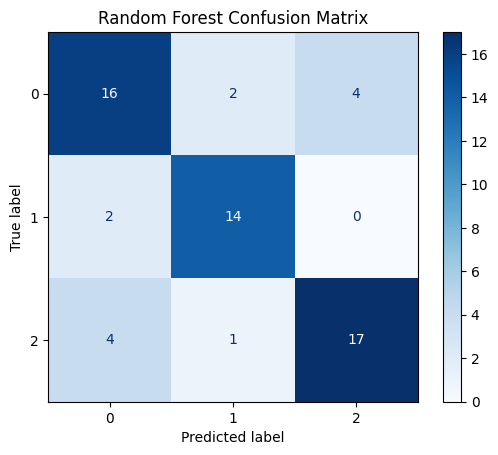

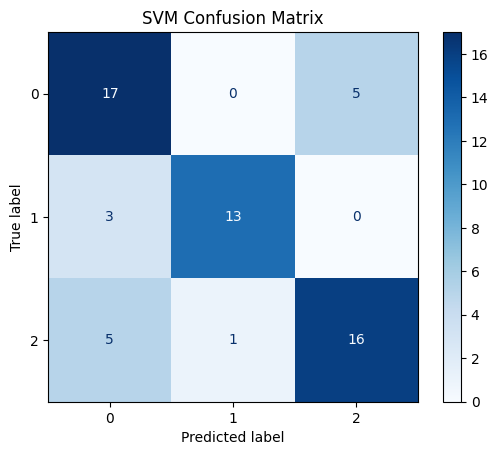

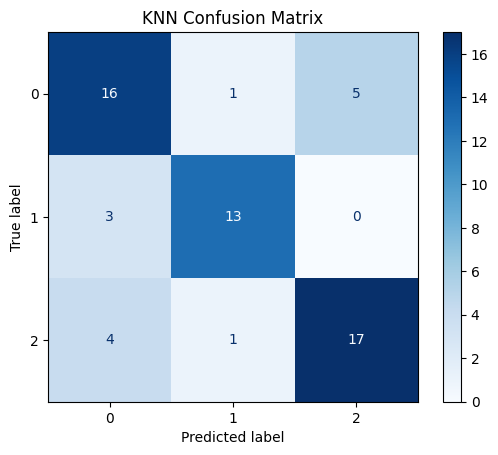

In [ ]:
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Plot confusion matrix for Random Forest
plot_confusion_matrix(y_test, rf.predict(X_test), "Random Forest Confusion Matrix")
# Plot confusion matrix for SVM
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
# Plot confusion matrix for KNN
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")